In [293]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [294]:
df=pd.read_csv('weatherAUS.csv')

In [295]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


# EDA

In [296]:
df.shape

(8425, 23)

we ave almost 8425 rows and 23 columns

In [297]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

We have missing values in Maximum Columns Will use Imputation to handle the missing data

In [298]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

OBSERVATION:

*We have Float64 and object datatypes in the columns 

*The date column is in object format we have to convert in to int as python can only understad 

# Data Handling:

In [299]:
df['Date']=pd.to_datetime(df['Date'])

In [300]:
df['Day']=df['Date'].dt.day

In [301]:
df['Month']=df['Date'].dt.month

In [302]:
df['year']=df['Date'].dt.year

Now will drop The Date column as we spltted in to date,month,year

In [303]:
df=df.drop('Date',axis=1)

In [304]:
df.dtypes

Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
Day                int64
Month              int64
year               int64
dtype: object

# IMPUTATION 

we will split the data in to catogorical and Numerical fetures

In [305]:
cat=df.select_dtypes(include=object).columns

In [306]:
num=df.select_dtypes(exclude=object).columns

In [307]:
cat

Index(['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday',
       'RainTomorrow'],
      dtype='object')

In [308]:
num

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'Day', 'Month', 'year'],
      dtype='object')

In [309]:
df[cat].isnull().sum()

Location          0
WindGustDir     991
WindDir9am      829
WindDir3pm      308
RainToday       240
RainTomorrow    239
dtype: int64

In [310]:
for i in cat:
    print(i)
    print(df[i].value_counts())
    print('>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>')
    print('\n')

Location
Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


WindGustDir
N      713
SSE    578
S      577
SW     572
E      557
WNW    531
W      507
WSW    504
SE     484
ENE    415
SSW    396
NW     383
NE     353
NNE    343
ESE    302
NNW    219
Name: WindGustDir, dtype: int64
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


WindDir9am
N      906
SW     704
NW     625
WSW    543
SE     505
WNW    480
SSW    467
ENE    433
NNE    430
W      414
NE     409
S      402
E      380
SSE    365
NNW    280
ESE    253
Name: WindDir9am, dtype: int64
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


WindDir3pm
SE     813
S      742
SSE    623
WSW    580
NE     544
N      524
SW     494
WNW    487
NW     468
W      462
ESE    462
E      460
ENE

In [311]:
df['WindGustDir'].value_counts()

N      713
SSE    578
S      577
SW     572
E      557
WNW    531
W      507
WSW    504
SE     484
ENE    415
SSW    396
NW     383
NE     353
NNE    343
ESE    302
NNW    219
Name: WindGustDir, dtype: int64

In [312]:
df['WindGustDir']=df['WindGustDir'].fillna(df['WindGustDir'].mode()[0])
df['WindDir9am']=df['WindDir9am'].fillna(df['WindDir9am'].mode()[0])
df['WindDir3pm']=df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0])
df['RainToday']=df['RainToday'].fillna(df['RainToday'].mode()[0])
df['RainTomorrow']=df['RainTomorrow'].fillna(df['RainTomorrow'].mode()[0])

In [313]:
df[num].isnull().sum()

MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustSpeed     991
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
Day                 0
Month               0
year                0
dtype: int64

In [314]:
df['MinTemp'].mean()

13.193305389221573

In [315]:
df['MinTemp']=df['MinTemp'].fillna(df['MinTemp'].mean())
df['MaxTemp']=df['MaxTemp'].fillna(df['MaxTemp'].mean())
df['Rainfall']=df['Rainfall'].fillna(df['Rainfall'].mean())
df['Evaporation']=df['Evaporation'].fillna(df['Evaporation'].mean())
df['Sunshine']=df['Sunshine'].fillna(df['Sunshine'].mean())
df['WindGustSpeed']=df['WindGustSpeed'].fillna(df['WindGustSpeed'].mean())
df['WindSpeed9am']=df['WindSpeed9am'].fillna(df['WindSpeed9am'].mean())
df['WindSpeed3pm']=df['WindSpeed3pm'].fillna(df['WindSpeed3pm'].mean())
df['Pressure9am']=df['Pressure9am'].fillna(df['Pressure9am'].mean())
df['Pressure3pm']=df['Pressure3pm'].fillna(df['Pressure3pm'].mean())
df['Cloud9am']=df['Cloud9am'].fillna(df['Cloud9am'].mean())
df['Cloud3pm']=df['Cloud3pm'].fillna(df['Cloud3pm'].mean())
df['Temp9am']=df['Temp9am'].fillna(df['Temp9am'].mean())
df['Temp3pm']=df['Temp3pm'].fillna(df['Temp3pm'].mean())
df['Humidity9am']=df['Humidity9am'].fillna(df['Humidity9am'].mean())
df['Humidity3pm']=df['Humidity3pm'].fillna(df['Humidity3pm'].mean())
#all the null values has been handled with the imputation Technique

In [316]:
#Now cross Verifying our dataset for missing values
df.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Day              0
Month            0
year             0
dtype: int64

Now our dataset is clear will proceed further

In [317]:
#Checking df for unique values 
#categorical
df[cat].nunique()

Location        12
WindGustDir     16
WindDir9am      16
WindDir3pm      16
RainToday        2
RainTomorrow     2
dtype: int64

In [318]:
#Numerical
df[num].nunique()

MinTemp          286
MaxTemp          332
Rainfall         251
Evaporation      117
Sunshine         141
WindGustSpeed     53
WindSpeed9am      35
WindSpeed3pm      36
Humidity9am       91
Humidity3pm       95
Pressure9am      385
Pressure3pm      375
Cloud9am          10
Cloud3pm          10
Temp9am          305
Temp3pm          329
Day               31
Month             12
year              10
dtype: int64

# Data Visualization

# Univarient Analysis:

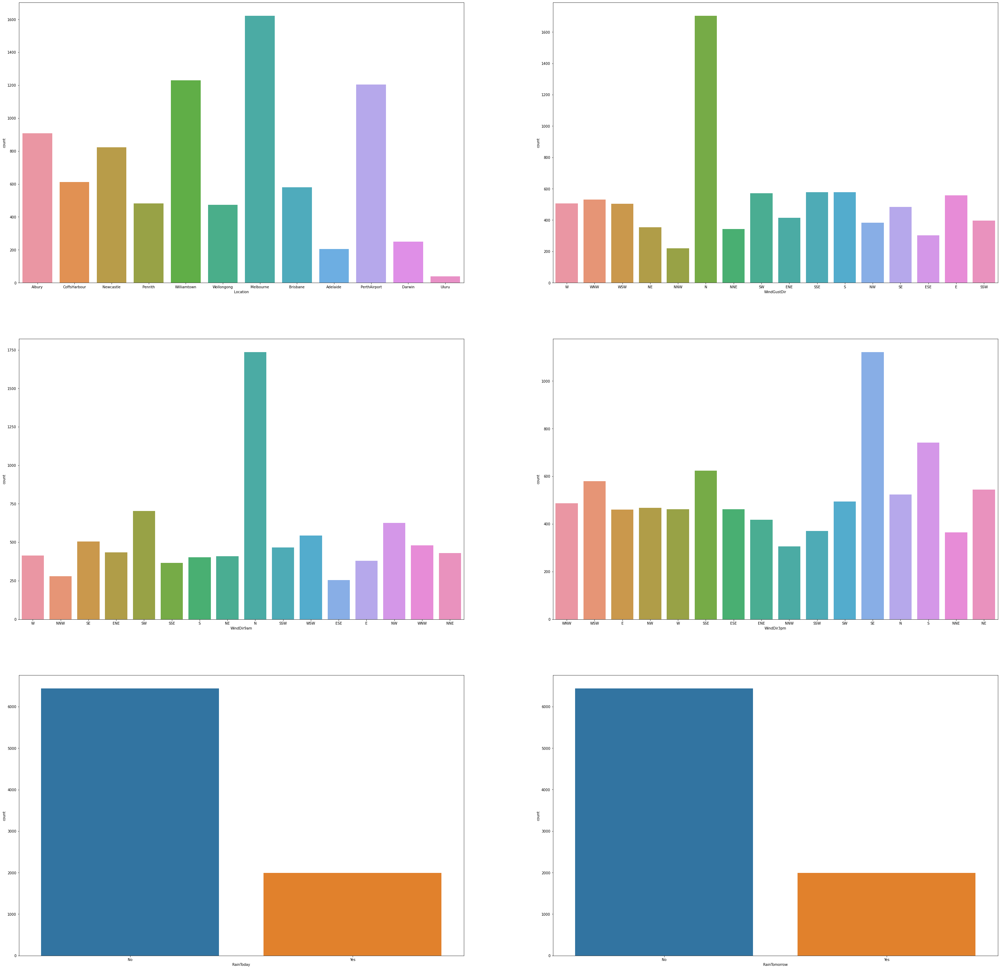

In [72]:
plt.subplots(figsize=(50,50))
plotnumber=1

for i in cat:
    if plotnumber<=6:
        ax=plt.subplot(3,2,plotnumber)
        sns.countplot(df[i])
    plotnumber+=1
plt.show()

Observation:
FEATURE:
*The melbourne is highest count colum in df

*The wind WindGustDi is mostly in N

*The windDir9am is also in N

*the winddir3pm is on SE direction

*The most of the rows in  Raintoaday is no 


Target:
*The Most of the rows in target Raintomorow is no 

    

# Bivarient Analysis

<AxesSubplot:xlabel='MinTemp', ylabel='MaxTemp'>

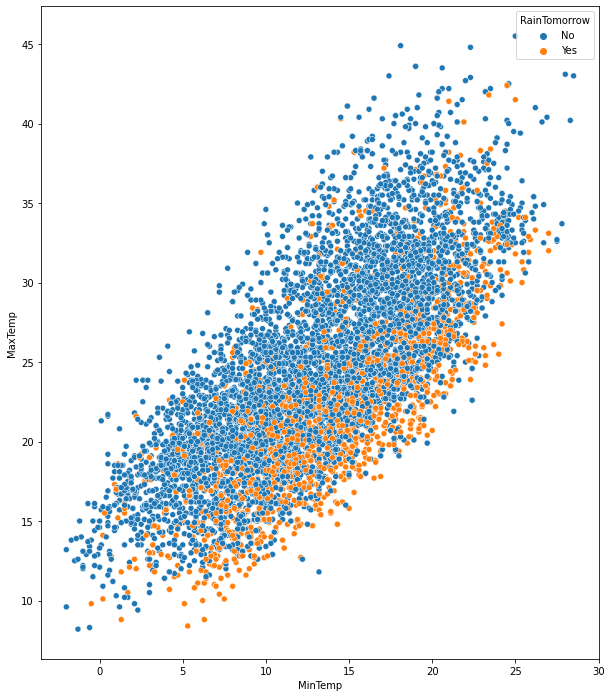

In [33]:
plt.subplots(figsize=(10,12))
sns.scatterplot(x=df['MinTemp'],y=df['MaxTemp'],hue=df['RainTomorrow'],data=df)
    

Observation:
    Most of them said tnat the probablity of rain at below 25 as min temp and and above 15 as max temprature

<AxesSubplot:xlabel='WindDir9am', ylabel='Location'>

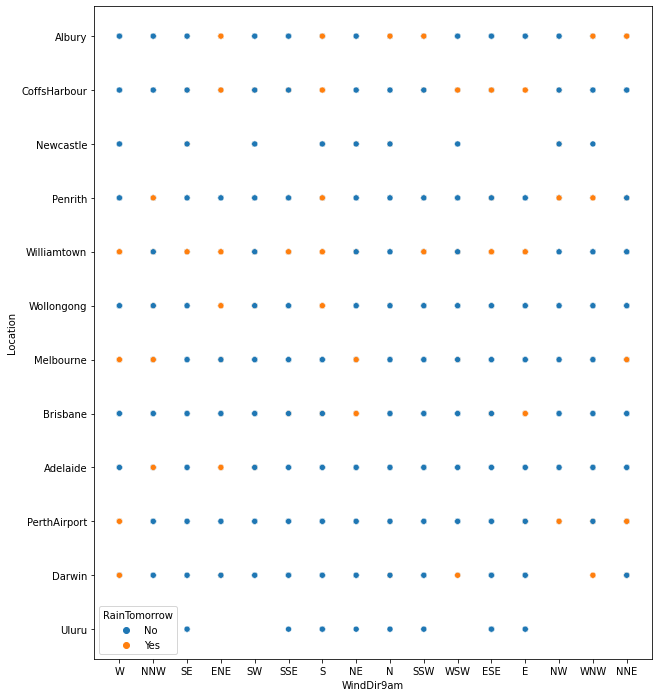

In [34]:
plt.subplots(figsize=(10,12))
sns.scatterplot(x=df['WindDir9am'],y=df['Location'],hue=df['RainTomorrow'],data=df)
    

observation:
*its observed that the probablity of rain is higher in william town followed by albury and coffsharbour

*The probablity of rain is higher if the winddir9pm in w and ENE direction

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Location'>

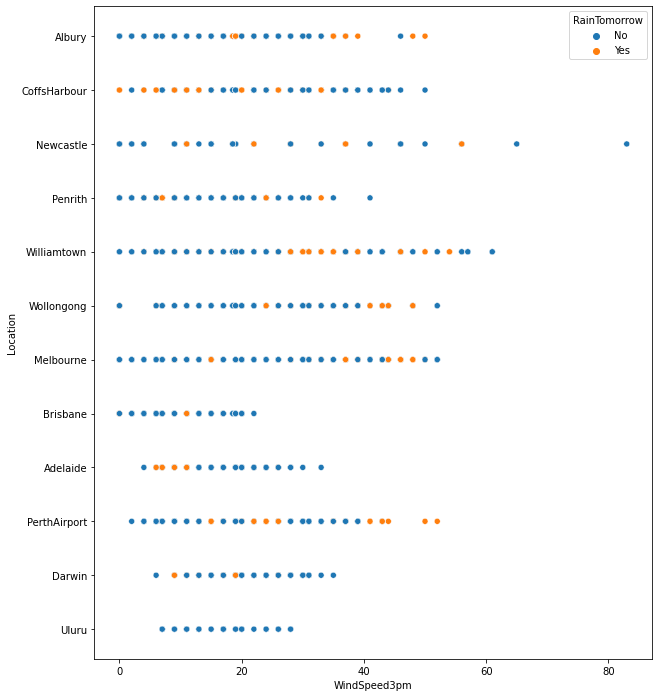

In [35]:
plt.subplots(figsize=(10,12))
sns.scatterplot(x=df['WindSpeed3pm'],y=df['Location'],hue=df['RainTomorrow'],data=df)

observation:
*The probablity of rain is higher in perthairport of which windspeed30 above 40

*The williams town having high probablity of rain observed that the  25 to 40 windspeed at 3pm has high probablity of rain and 

<AxesSubplot:xlabel='Humidity9am', ylabel='Location'>

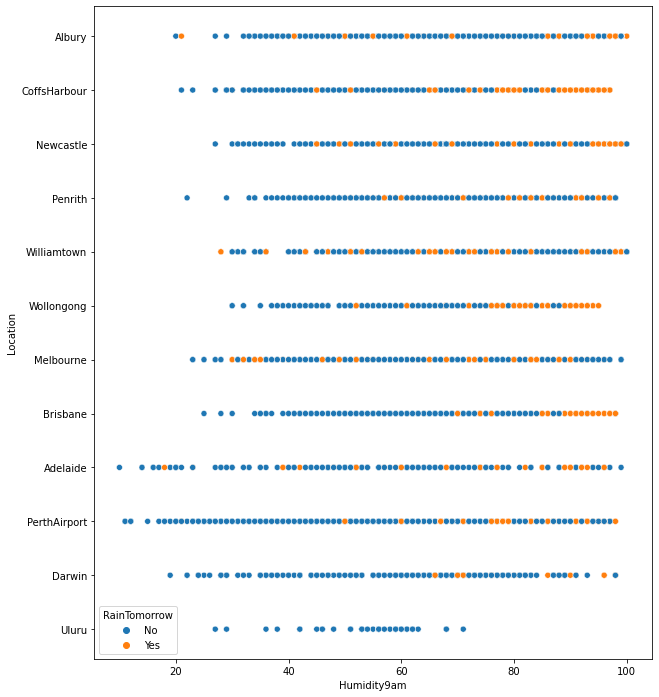

In [38]:
plt.subplots(figsize=(10,12))
sns.scatterplot(x=df['Humidity9am'],y=df['Location'],hue=df['RainTomorrow'],data=df)

Observation:
*The observation of rain is higher if humidity is above 60 in and below 80 in william town

*the brisbane has storong probablity of rainfall tomorrow if the humidity is above  90 to 100 

*The coffsharbour has hig probablity of rain tomorrow if the humidity is above 70 


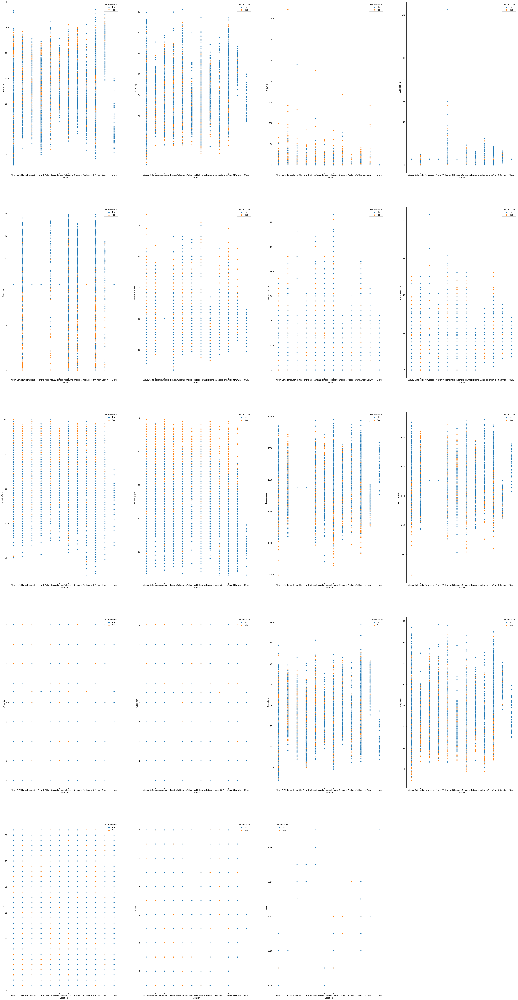

In [50]:
plt.subplots(figsize=(50,100))
plotnumber=1

for i in num:
    if plotnumber<=19:
        ax=plt.subplot(5,4,plotnumber)
        sns.scatterplot(x=df['Location'],y=df[i],hue=df['RainTomorrow'],data=df)
    plotnumber+=1
plt.show()

*if the humidity3pm is bove 70 there is high chance of rainfall tomorrow

*The lower the pressure the higher the chance of rainfall if pressure9am falls below 1020 there is a high problity of rain tomorrow in albury,melbourne,airport

*if temp3pmlls beow 15 in all states except ulluru there is high probablity of rain tomorrow especially melbourne,albury,willaiamtown

*The 20 to 25th day has hig probablity of rain in most of the states
 

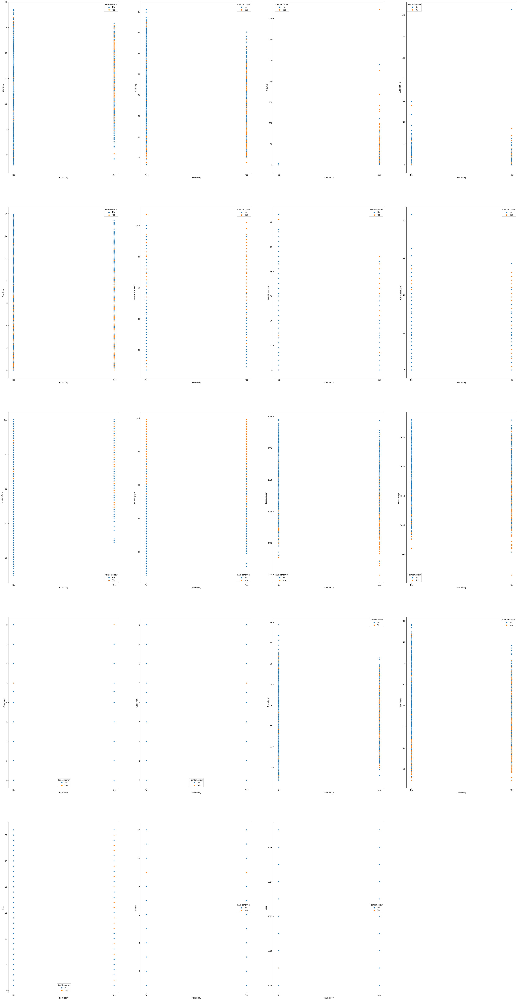

In [56]:
plt.subplots(figsize=(50,100))
plotnumber=1

for i in num:
    if plotnumber<=19:
        ax=plt.subplot(5,4,plotnumber)
        sns.scatterplot(x=df['RainToday'],y=df[i],hue=df['RainTomorrow'],data=df)
    plotnumber+=1
plt.show()

if its rain today and  sunshine is below  6 there is high probablity of rain tomorrow

if its rain today and the windgustspeed is above 60 there is high probablity of rain tomorrow

if its rain today and the windspeed9am is higher than 20 then there is high probablity of rain tomorrow

if its rain today and windspeed3pm is higher than 40 there is high probablity of rain tomorrow

if its rain today and the pressure9am is lower than1010 there is high chance of probablity to rain tomorrow

if the temprature falls below 15 there is high probablity of rain tomorrow if its raining today or not



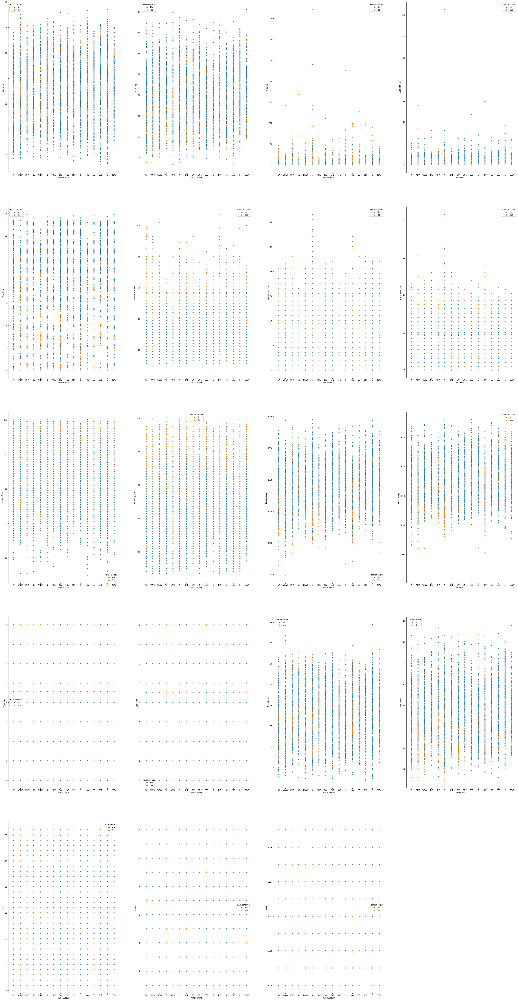

In [57]:
plt.subplots(figsize=(50,100))
plotnumber=1

for i in num:
    if plotnumber<=19:
        ax=plt.subplot(5,4,plotnumber)
        sns.scatterplot(x=df['WindGustDir'],y=df[i],hue=df['RainTomorrow'],data=df)
    plotnumber+=1
plt.show()

IF THE WINDGUSTDIR IN NW AND MIN TEMP IS 10 TO 15 THERE IS HIGH PROBABLITY OF RAIN

IF THE WINDGUSTDIR IN NW AND WINDSPEED3PM IS GREATER THAN 30 THERE IS HIGH CHANCE OF RAINFALL

IF THE WINDGUSTSPPED IS GREATER THAN 40 IN ALL DIRECTION THERE IS HIGH PROBABLITY OF RAIN TOMORROW

IF THE HUMITY ABOVE 60 CAUSES RAINFALL IN ALL STATE 

THE CLOUD 3PM WHICH OCCOURS AT 8 HAVE HIGH PROBABLITY OF RAIN EXCEPT SSW,E,SE,N,NNE


# Multivarient Analysis:

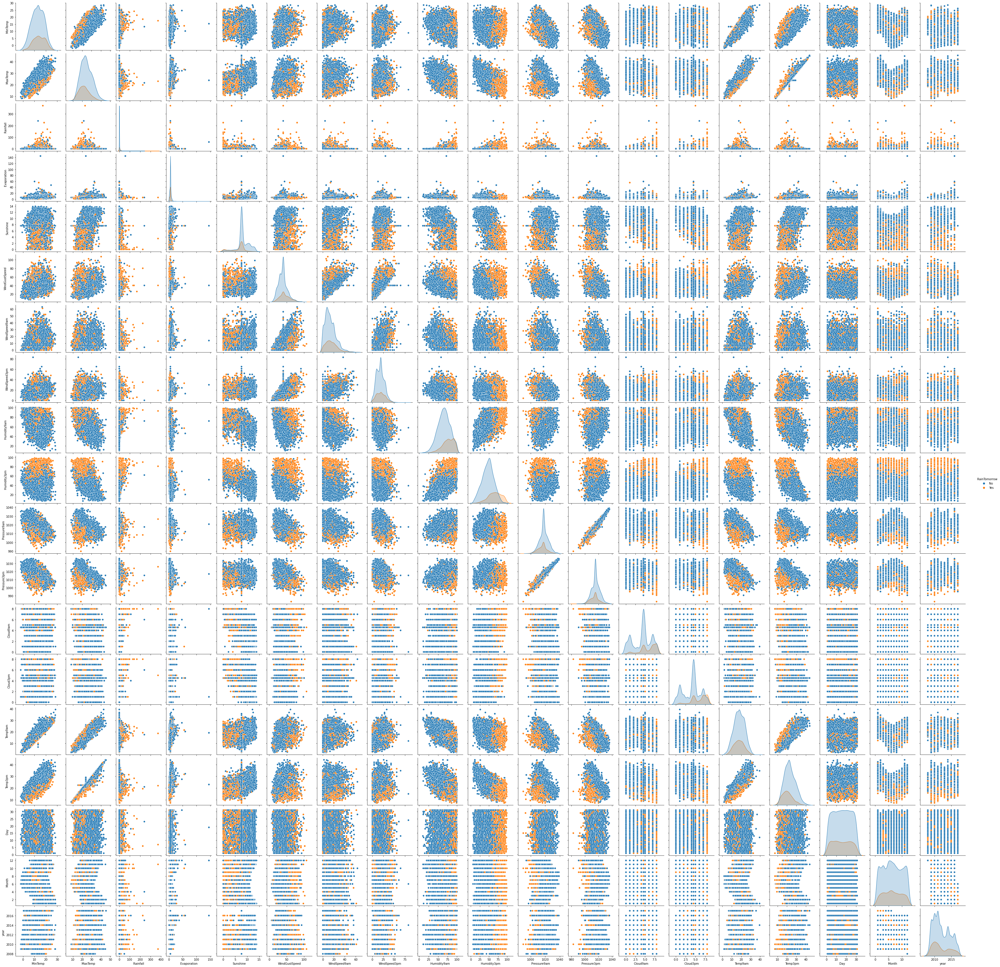

In [58]:
sns.pairplot(df,hue='RainTomorrow')

There is skewness in some columns 

will remove it with proper method


# Data Preprocessing

Identifying the outliers in Numerical columns

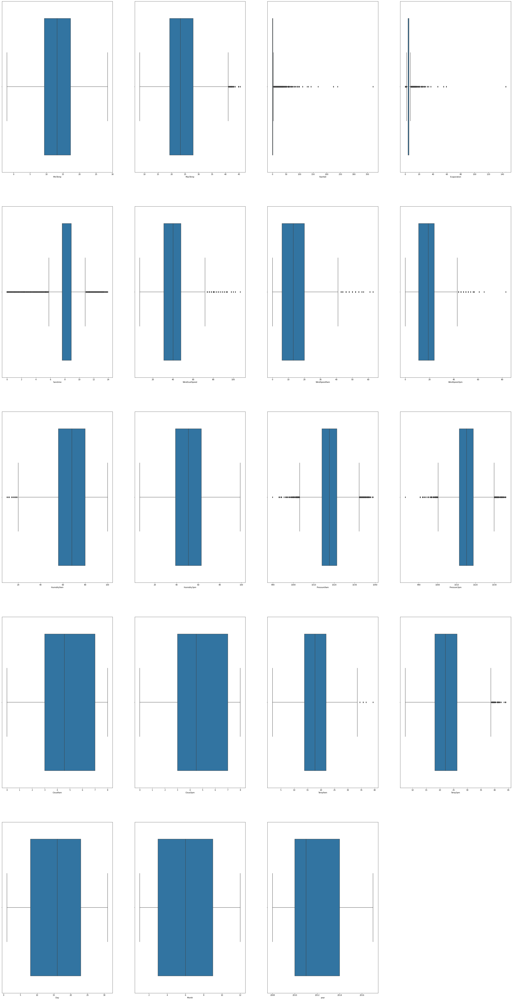

In [319]:
plt.subplots(figsize=(50,100))
plotnumber=1

for i in num:
    if plotnumber<=19:
        ax=plt.subplot(5,4,plotnumber)
        sns.boxplot(df[i])
    plotnumber+=1
plt.show()

In [320]:
df[num].dtypes

MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustSpeed    float64
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
Day                int64
Month              int64
year               int64
dtype: object

observation:
Presence of outliers in Maxtemp,Evopration,Rainfall,windspeed3pm,windspeed9am,windgustspeed,sunshine,humidity9am,pressure9am,pressure3pm,temp3pm,cloud3pm

In [321]:
num

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'Day', 'Month', 'year'],
      dtype='object')

In [322]:
feature=df[['MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm','Temp9am','Temp3pm']]

In [323]:
from scipy.stats import zscore
z=np.abs(zscore(feature))

In [324]:
z

,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm
0,1.570089e-01,0.213986,2.305893e-16,1.257472e-15,0.277710,0.607461,0.563297,0.189439,1.597406,1.584003,1.308665,0.153712,0.108138
1,2.028121e-01,0.272189,2.305893e-16,1.257472e-15,0.277710,0.972321,0.357200,1.420268,1.433568,1.121880,1.196072,0.100217,0.312348
2,3.009450e-01,0.272189,2.305893e-16,1.257472e-15,0.422897,0.508725,0.769394,1.777981,1.160505,1.599939,1.051309,0.577390,0.127334
3,6.771214e-01,0.272189,2.305893e-16,1.257472e-15,1.174166,0.281166,0.982428,1.360650,1.925081,0.006411,0.391836,0.060269,0.682376
4,1.380408e+00,0.175183,2.305893e-16,1.257472e-15,0.059928,0.676112,0.151104,0.845246,0.996668,1.090010,1.485596,0.006773,1.220599
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,7.523137e-02,0.272189,2.305893e-16,1.257472e-15,0.666009,0.083694,0.776331,1.002937,1.488181,1.109058,0.814518,1.366273,0.007221
8421,2.355231e-01,0.272189,2.305893e-16,1.257472e-15,1.319354,0.083694,0.982428,0.704843,1.652018,0.933770,0.621501,1.223619,0.345987
8422,4.972110e-01,0.272189,2.305893e-16,1.257472e-15,0.230447,0.478639,0.982428,0.883699,1.488181,0.535388,0.251553,0.938310,0.615099
8423,5.135665e-01,0.272189,2.305893e-16,1.257472e-15,0.883791,0.083694,1.188525,1.002937,1.488181,0.280424,0.203299,0.474684,0.598279


In [325]:
new_df=df[(z<3).all(axis=1)]
new_df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,year
0,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,WNW,...,1007.1,8.000000,4.503183,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,WSW,...,1007.8,4.566622,4.503183,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,WSW,...,1008.7,4.566622,2.000000,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,E,...,1012.8,4.566622,4.503183,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,NW,...,1006.0,7.000000,8.000000,17.8,29.7,No,No,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,ENE,...,1020.3,4.566622,4.503183,10.1,22.4,No,No,21,6,2017
8421,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,N,...,1019.1,4.566622,4.503183,10.9,24.5,No,No,22,6,2017
8422,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,WNW,...,1016.8,4.566622,4.503183,12.5,26.1,No,No,23,6,2017
8423,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,N,...,1016.5,3.000000,2.000000,15.1,26.0,No,No,24,6,2017


In [ ]:
#Data loss

In [326]:
df.shape

(8425, 25)

In [327]:
new_df.shape

(7987, 25)

In [328]:
dataloss=(8425-7987)/8425*100

In [329]:
dataloss

5.198813056379822

we have almost 5 percent dataloss

Now we will check for skewness:

In [330]:
new_df.skew()

MinTemp         -0.084549
MaxTemp          0.314510
Rainfall         3.488446
Evaporation      0.846181
Sunshine        -0.723970
WindGustSpeed    0.506897
WindSpeed9am     0.711395
WindSpeed3pm     0.300109
Humidity9am     -0.231656
Humidity3pm      0.125150
Pressure9am      0.020735
Pressure3pm      0.044876
Cloud9am        -0.356892
Cloud3pm        -0.266829
Temp9am         -0.038035
Temp3pm          0.334170
Day              0.002731
Month            0.054460
year             0.430100
dtype: float64

There is skewness in Evopration,windspeed9am,Rainfall

In [331]:
new_df['Evaporation']=np.sqrt(new_df['Evaporation'])
new_df['WindSpeed9am']=np.sqrt(new_df['WindSpeed9am'])
new_df['Rainfall']=np.sqrt(new_df['Rainfall'])

In [332]:
new_df.skew()

MinTemp         -0.084549
MaxTemp          0.314510
Rainfall         1.889196
Evaporation     -0.410953
Sunshine        -0.723970
WindGustSpeed    0.506897
WindSpeed9am    -0.517704
WindSpeed3pm     0.300109
Humidity9am     -0.231656
Humidity3pm      0.125150
Pressure9am      0.020735
Pressure3pm      0.044876
Cloud9am        -0.356892
Cloud3pm        -0.266829
Temp9am         -0.038035
Temp3pm          0.334170
Day              0.002731
Month            0.054460
year             0.430100
dtype: float64

now most of our skewness removed but not compkletly ,let us find the distribution

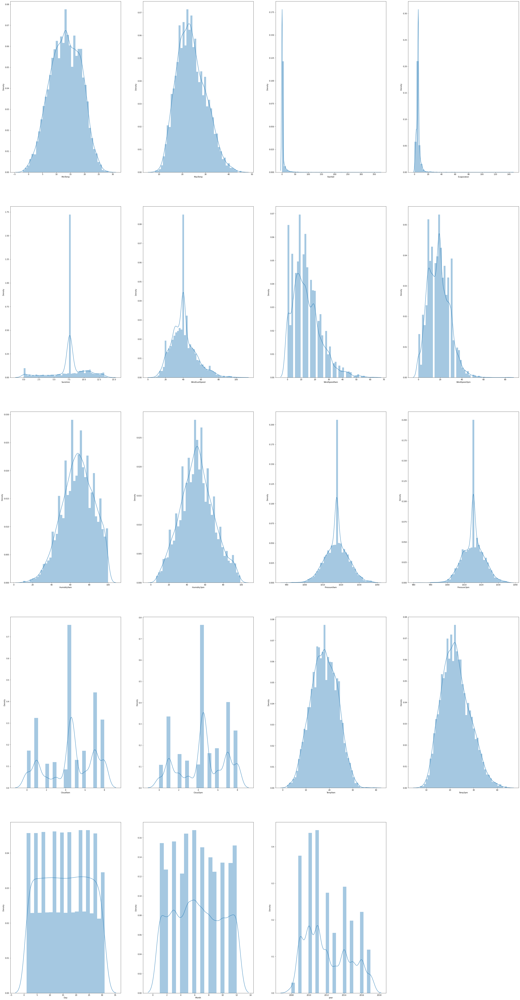

In [333]:
plt.subplots(figsize=(50,100))
plotnumber=1

for i in num:
    if plotnumber<=19:
        ax=plt.subplot(5,4,plotnumber)
        sns.distplot(df[i])
    plotnumber+=1
plt.show()

Now our distribution looks bit Normal will proceed forward

# Encoding:

# #LabelEncoder:

In [334]:
from sklearn.preprocessing import LabelEncoder

In [335]:
LE=LabelEncoder()
new_df[cat]= new_df[cat].apply(LE.fit_transform)
new_df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,year
0,1,13.4,22.900000,0.774597,2.321507,7.632205,13,44.000000,13,14,...,1007.1,8.000000,4.503183,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.100000,0.000000,2.321507,7.632205,14,44.000000,6,15,...,1007.8,4.566622,4.503183,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.700000,0.000000,2.321507,7.632205,15,46.000000,13,15,...,1008.7,4.566622,2.000000,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.000000,0.000000,2.321507,7.632205,4,24.000000,9,0,...,1012.8,4.566622,4.503183,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.300000,1.000000,2.321507,7.632205,13,41.000000,1,7,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9,2.8,23.400000,0.000000,2.321507,7.632205,0,31.000000,9,1,...,1020.3,4.566622,4.503183,10.1,22.4,0,0,21,6,2017
8421,9,3.6,25.300000,0.000000,2.321507,7.632205,6,22.000000,9,3,...,1019.1,4.566622,4.503183,10.9,24.5,0,0,22,6,2017
8422,9,5.4,26.900000,0.000000,2.321507,7.632205,3,37.000000,9,14,...,1016.8,4.566622,4.503183,12.5,26.1,0,0,23,6,2017
8423,9,7.8,27.000000,0.000000,2.321507,7.632205,9,28.000000,10,3,...,1016.5,3.000000,2.000000,15.1,26.0,0,0,24,6,2017


#Now Our data is encoded 

# Correlation between the target variable and independent variables using HEAT map

<AxesSubplot:>

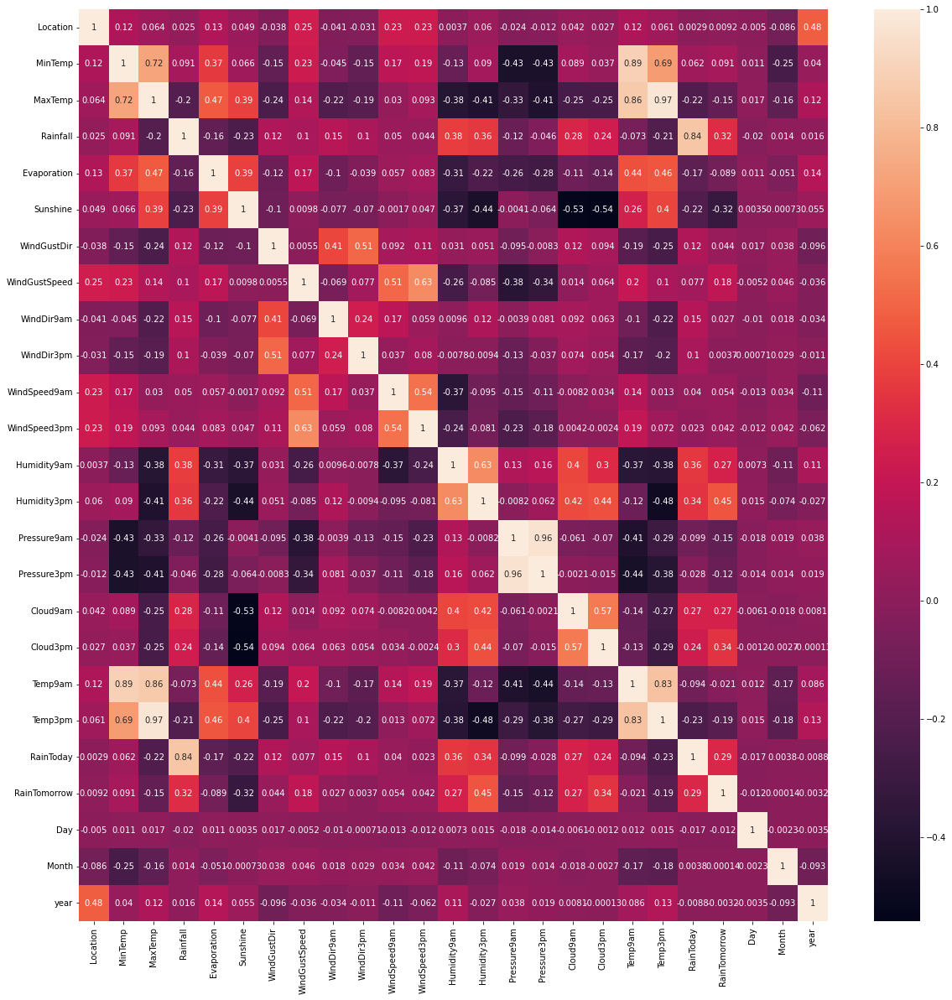

In [336]:
plt.subplots(figsize=(20,20))
sns.heatmap(new_df.corr(),annot=True)

The humidity 3pm ,raintoday,cloud3pm,cloud9am,humidity(3pm &9am),Rainfall has a positive corr with the target 

The day temp(3pm&9am),pressure,maxtemp has a negative corr with the target

The locaton is high positive corr with the year


In [337]:
cor=new_df.corr()
cor

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,year
Location,1.000000,0.116694,0.063798,0.024695,0.128261,0.048579,-0.037707,0.245658,-0.041030,-0.031195,...,-0.012288,0.041859,0.027050,0.118100,0.060707,0.002934,0.009222,-0.004978,-0.086011,0.481143
MinTemp,0.116694,1.000000,0.718598,0.091068,0.366061,0.065682,-0.154935,0.231097,-0.045231,-0.154184,...,-0.427936,0.089354,0.036649,0.888690,0.687570,0.061728,0.091021,0.010924,-0.247066,0.040001
MaxTemp,0.063798,0.718598,1.000000,-0.200758,0.468235,0.387050,-0.237955,0.136337,-0.217160,-0.190417,...,-0.414358,-0.252579,-0.248268,0.864864,0.974957,-0.219747,-0.149708,0.017068,-0.164351,0.120204
Rainfall,0.024695,0.091068,-0.200758,1.000000,-0.155887,-0.228786,0.120849,0.100934,0.150800,0.104214,...,-0.046470,0.283353,0.241392,-0.073122,-0.211102,0.844213,0.317666,-0.019818,0.013598,0.015722
Evaporation,0.128261,0.366061,0.468235,-0.155887,1.000000,0.385308,-0.119515,0.173491,-0.104359,-0.039052,...,-0.275208,-0.108208,-0.142809,0.435477,0.455210,-0.168056,-0.089387,0.010554,-0.051104,0.141194
Sunshine,0.048579,0.065682,0.387050,-0.228786,0.385308,1.000000,-0.104739,0.009797,-0.076595,-0.069789,...,-0.063832,-0.527350,-0.541996,0.261680,0.403489,-0.219089,-0.317675,0.003451,-0.000727,0.054960
WindGustDir,-0.037707,-0.154935,-0.237955,0.120849,-0.119515,-0.104739,1.000000,0.005465,0.405681,0.507292,...,-0.008263,0.123415,0.093527,-0.185080,-0.249791,0.121709,0.044378,0.017003,0.038044,-0.096042
WindGustSpeed,0.245658,0.231097,0.136337,0.100934,0.173491,0.009797,0.005465,1.000000,-0.069460,0.076737,...,-0.336132,0.013678,0.064375,0.198936,0.101786,0.076677,0.181478,-0.005232,0.045638,-0.035546
WindDir9am,-0.041030,-0.045231,-0.217160,0.150800,-0.104359,-0.076595,0.405681,-0.069460,1.000000,0.243622,...,0.081400,0.092396,0.062637,-0.101576,-0.224390,0.149239,0.027091,-0.010014,0.018344,-0.034468
WindDir3pm,-0.031195,-0.154184,-0.190417,0.104214,-0.039052,-0.069789,0.507292,0.076737,0.243622,1.000000,...,-0.037280,0.073742,0.054321,-0.172000,-0.202000,0.100983,0.003674,-0.000714,0.028629,-0.010781


In [338]:
cor['RainTomorrow'].sort_values(ascending=False)

RainTomorrow     1.000000
Humidity3pm      0.445891
Cloud3pm         0.337922
Rainfall         0.317666
RainToday        0.294528
Humidity9am      0.269722
Cloud9am         0.269598
WindGustSpeed    0.181478
MinTemp          0.091021
WindSpeed9am     0.053805
WindGustDir      0.044378
WindSpeed3pm     0.042472
WindDir9am       0.027091
Location         0.009222
WindDir3pm       0.003674
Month            0.000135
year            -0.003180
Day             -0.012493
Temp9am         -0.021459
Evaporation     -0.089387
Pressure3pm     -0.124953
MaxTemp         -0.149708
Pressure9am     -0.152692
Temp3pm         -0.191706
Sunshine        -0.317675
Name: RainTomorrow, dtype: float64

This show the high positive and negative corr feature with target

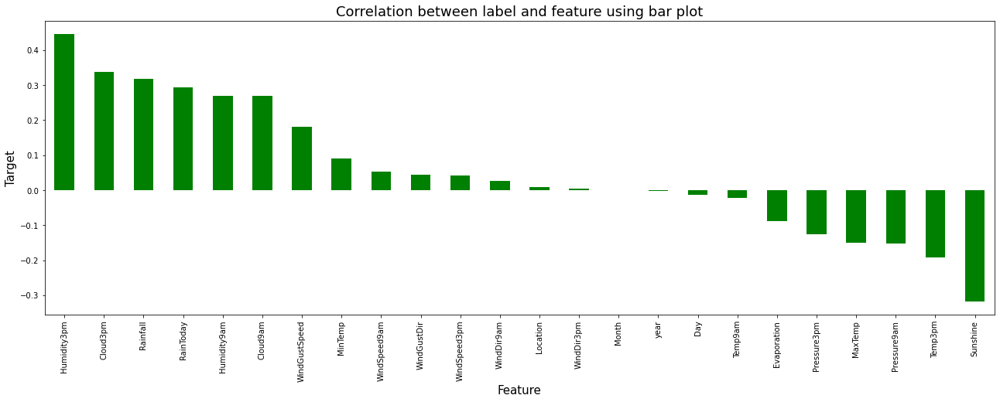

In [339]:
plt.figure(figsize=(22,7))
new_df.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar',color='g')
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.title('Correlation between label and feature using bar plot',fontsize=18)
plt.show()

*we observe that the month winddie3pm and year have almose zero corr with target 

so will drop if necessary

# Splitting target and Features

In [340]:
x = new_df.drop("RainTomorrow", axis=1)
y = new_df["RainTomorrow"]

In [341]:
y.value_counts()

0    6165
1    1822
Name: RainTomorrow, dtype: int64

In [342]:
y.shape

(7987,)

In [343]:
x.shape

(7987, 24)

In [349]:
from imblearn.over_sampling import SMOTE
smt=SMOTE()
x,y=smt.fit_resample(x,y)
print(x.shape)
print(y.shape)

(12330, 24)
(12330,)


Now our data is balanced will check for vif to find the multicolinearity problem

In [350]:
# finding varience inflation factor in each scaled column i.e. x.shape[1](1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF values"]=[variance_inflation_factor(x_sm.values,i)
              for i in range(len(x_sm.columns))]
vif["Features"] = x_sm.columns
vif

,VIF values,Features
0,5.153176,Location
1,71.934471,MinTemp
2,421.054238,MaxTemp
3,4.623578,Rainfall
4,28.723864,Evaporation
5,14.424450,Sunshine
6,5.499089,WindGustDir
7,22.333305,WindGustSpeed
8,5.218069,WindDir9am
9,6.302833,WindDir3pm


# PCA:

In the heat map we have found some features having high correlation between each other which means multicolinearity problem so let's check the VIF value to solve multicolinearity problem.

In [351]:
# Applying PCA to reduce multicollinearity
# Import library to perform PCA
from sklearn.decomposition import PCA

In [352]:
# Creating instance of class to identify number of components for cumulative variance of 95%
pca = PCA()

In [353]:
X_pca=pca.fit_transform(x_sm)
X_pca.shape

(12330, 24)

In [354]:
corrmat = np.corrcoef(X_pca.transpose())
corrmat.shape

(24, 24)

<AxesSubplot:>

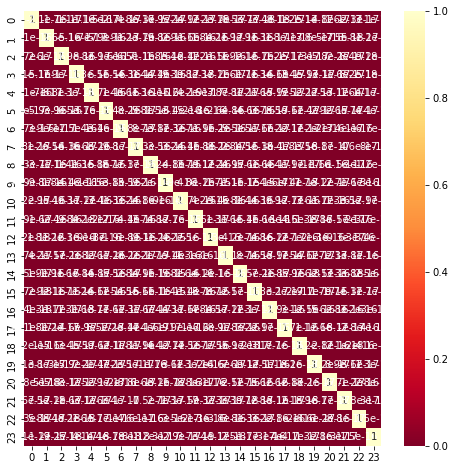

In [355]:
# Plotting heatmap to oserve the correlation between features
plt.figure(figsize=[8,8])
sns.heatmap(corrmat,cmap='YlOrRd_r', annot=True)

# Feature scaling using standardScaler()

In [356]:
from sklearn.preprocessing import StandardScaler
scale=StandardScaler()
X_pca=scale.fit_transform(X_pca)
X_pca

array([[ 1.1622866 , -0.1838876 ,  1.40708071, ...,  0.96514657,
         0.38954512,  0.98963146],
       [ 1.78324631, -0.06782099,  0.48054494, ..., -0.65257412,
         0.36232303, -0.14549879],
       [ 1.8249611 ,  0.38470791, -0.06909763, ...,  0.13459683,
        -0.04802759, -0.02433566],
       ...,
       [ 0.74329629,  0.24362842,  0.38202782, ...,  0.27858794,
         0.5586791 ,  1.50821589],
       [-0.1286874 ,  0.04424799, -1.57753289, ..., -0.45325903,
         0.65823796, -1.48973273],
       [-0.75750836,  0.25530698,  1.71240957, ...,  0.00991019,
        -1.09719658,  0.70229237]])

We have scaled the data using standard scalarization method to overcome with the issue of data biasness.

# Model Building:

In [357]:
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


In [358]:
# Finding Best Random State
maxAcc=0
maxRS=0

for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(X_pca,y,random_state=i,test_size=0.30)
    LR=LogisticRegression()
    LR.fit(x_train,y_train)
    predrf=LR.predict(x_test)
    acc=accuracy_score(y_test,predrf)
    if acc>maxAcc:
        maxAcc=acc
        maxRS=i
print('Best score is',maxAcc,'on Random State',maxRS)

Best score is 0.8007569613409029 on Random State 153


In [ ]:
x_train,x_test,y_train,y_test=train_test_split(X_pca,sm_y,test_size=.30,random_state=maxRS)

In [359]:
import sklearn
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
import warnings
warnings.filterwarnings('ignore')


model=[LogisticRegression(),GaussianNB(),SVC(),DecisionTreeClassifier(),KNeighborsClassifier(),]

for m in model:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    predm=m.predict(x_test)
    print("Train score",m.score(x_train,y_train))
    print('Accuracy score of',m, 'is:')
    print(accuracy_score(y_test,predm))
    print(confusion_matrix(y_test,predm))
    print(classification_report(y_test,predm))
    print('\n')

Train score 0.7858880778588808
Accuracy score of LogisticRegression() is:
0.7791294944579616
[[1495  382]
 [ 435 1387]]
              precision    recall  f1-score   support

           0       0.77      0.80      0.79      1877
           1       0.78      0.76      0.77      1822

    accuracy                           0.78      3699
   macro avg       0.78      0.78      0.78      3699
weighted avg       0.78      0.78      0.78      3699



Train score 0.7685088633993743
Accuracy score of GaussianNB() is:
0.7618275209516085
[[1463  414]
 [ 467 1355]]
              precision    recall  f1-score   support

           0       0.76      0.78      0.77      1877
           1       0.77      0.74      0.75      1822

    accuracy                           0.76      3699
   macro avg       0.76      0.76      0.76      3699
weighted avg       0.76      0.76      0.76      3699



Train score 0.9264279921214228
Accuracy score of SVC() is:
0.8905109489051095
[[1630  247]
 [ 158 1664]]
     

In [360]:
# Checking accuracy for Random Forest Classifier
rfc = RandomForestClassifier(n_estimators=100,random_state=170,criterion='gini')
rfc.fit(x_train,y_train)

# Prediction
predrfc=rfc.predict(x_test)
print("Train score",rfc.score(x_train,y_train))
print("Test score",accuracy_score(y_test, predrfc))
print(confusion_matrix(y_test, predrfc))
print(classification_report(y_test,predrfc))

Train score 1.0
Test score 0.9194376858610436
[[1705  172]
 [ 126 1696]]
              precision    recall  f1-score   support

           0       0.93      0.91      0.92      1877
           1       0.91      0.93      0.92      1822

    accuracy                           0.92      3699
   macro avg       0.92      0.92      0.92      3699
weighted avg       0.92      0.92      0.92      3699



In [ ]:
This model is overfitting as train score is very high and variance between train and test score is also high.

In [361]:
# Checking accuracy for Gradient Boosting Classifier
GBc=GradientBoostingClassifier()
GBc.fit(x_train,y_train)

# Prediction
predGBc=GBc.predict(x_test)
print("Train score",GBc.score(x_train,y_train))
print("Test score",accuracy_score(y_test, predGBc))
print(confusion_matrix(y_test, predGBc))
print(classification_report(y_test,predGBc))

Train score 0.8525083999536555
Test score 0.8242768315761017
[[1539  338]
 [ 312 1510]]
              precision    recall  f1-score   support

           0       0.83      0.82      0.83      1877
           1       0.82      0.83      0.82      1822

    accuracy                           0.82      3699
   macro avg       0.82      0.82      0.82      3699
weighted avg       0.82      0.82      0.82      3699



Here train score and test score both are having good accoracy and the variance between train and test score is almost nil. So we can Select this model.

Let's do some hyperparameter tuning

In [362]:
from sklearn.model_selection import RandomizedSearchCV,cross_val_score

# we are checking best parameter which suited most for the model

para = {"n_estimators":[100,200,300,400],
        "learning_rate":[0.1,0.3,0.5],
        "max_depth" :[3,5,7,9,10]}

grid = RandomizedSearchCV(GBc, para, scoring= "accuracy",cv = 5, n_iter=50,n_jobs=-1,verbose=2)

grid.fit(x_train,y_train)
print("Train score",grid.score(x_train,y_train))
print("score",grid.best_score_)
print("best parameter",grid.best_params_)
print("best estimator",grid.best_estimator_)
grid_pred=grid.best_estimator_.predict(x_test) # predicting with best parameters

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Train score 1.0
score 0.9197092594543348
best parameter {'n_estimators': 400, 'max_depth': 9, 'learning_rate': 0.3}
best estimator GradientBoostingClassifier(learning_rate=0.3, max_depth=9, n_estimators=400)


In [363]:
best_parameter_GB = GradientBoostingClassifier(learning_rate=0.3, max_depth=10, n_estimators=400)
for i in range(2,7):
    cv=cross_val_score(GBc,X_pca,y,cv=i)
    print(f'at CV {i} The mean is  {cv.mean()} and the SD is {cv.std()}') 

at CV 2 The mean is  0.7092457420924574 and the SD is 0.03138686131386864
at CV 3 The mean is  0.7223033252230332 and the SD is 0.07059772814233506
at CV 4 The mean is  0.7364253963930646 and the SD is 0.07618497526451282
at CV 5 The mean is  0.7444444444444444 and the SD is 0.06849934673917484
at CV 6 The mean is  0.7330089213300893 and the SD is 0.08862402152689616


In [365]:
RainTomorrow=GradientBoostingClassifier(learning_rate=0.3, max_depth=10, n_estimators=400)
RainTomorrow.fit(x_train, y_train)
pred=RainTomorrow.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

93.16031359826981


so after hyperparametertuning our model gave a accuracy of 93%

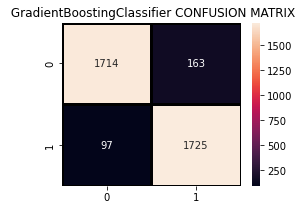

In [402]:
plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, grid_pred),annot=True,fmt=".0f",linecolor="k",linewidths=3)
    
plt.title(" GradientBoostingClassifier CONFUSION MATRIX")
plt.show()

# Plotting AUC ROC Curve

In [373]:
from sklearn.metrics import roc_curve
from sklearn.metrics import plot_roc_curve
import matplotlib.pyplot as plt

from sklearn.metrics import roc_auc_score

In [374]:
GBc.fit(x_train,y_train)

GradientBoostingClassifier()

In [380]:
y_pred_prob=GBc.predict_proba(x_test)[:,1]
y_pred_prob

array([0.43530435, 0.91441169, 0.75452321, ..., 0.07704142, 0.12990512,
       0.07570916])

In [381]:
fpr,tpr,thresholds=roc_curve(y_test,y_pred_prob)

In [383]:
auc_score=roc_auc_score(y_test,GBc.predict(x_test))
print(auc_score)

0.8240761263360794


<Figure size 432x288 with 0 Axes>

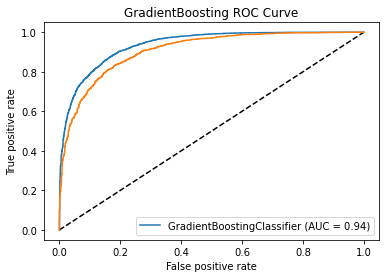

In [384]:
plt.figure(figsize=[6,4])
plot_roc_curve(GBc,x_train,y_train)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr,label='GradientBoostingClassifier')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('GradientBoosting ROC Curve')
plt.show()

# Conclusion

In [386]:
import numpy as np
original=np.array(y_test)
Predicted=np.array(predGBc)
df_com=pd.DataFrame({'Original':original,'Predicted':Predicted},index=range(len(original)))
df_com

,Original,Predicted
0,0,0
1,1,1
2,1,1
3,1,1
4,0,0
...,...,...
3694,1,1
3695,0,0
3696,0,0
3697,0,0


So,there is a 89% chance of rain can fall on tommorow .

Where ever there will be rainfall, it will be more than 1 mm.

# Model Saving

In [390]:
import pickle
filename='rainfallprediction.pkl'
pickle.dump(GBc,open(filename,'wb'))